# Overview

This notebook trained [SSD](https://arxiv.org/abs/1512.02325) to detect car plates and subsequently converted it to a TFLite to be deployable on mobile phones in the later stage of the product.

This investigation of the SSD model is part of the exploratory phase. It will later be compared with other solutions in terms of accuracy, computation cost, deployability on mobile phone, etc.

# Summary
The notebook does the following:
- Convert YOLOv7 training data to a format usable by SSD
- Train the model
- Convert to TF then TFLite
- Make predictions using TFLite

## Data
We have limited labelled dataset to train the model. In this project, [this public dataset](https://drive.google.com/drive/folders/1DghyfRyo3Rdl0lxBwkevsBjKIjJ_5NrX) was used to train the model. The train/test sets consist of 1500/300 images of car plates respectively.

## Notes
The assessment of the model performance is not discussed in this notebook. Instead, there will be another notebook that compares the performance of different solutions that we have.




# Setup environment

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
proj_dir = '/content/gdrive/My Drive/colab_notebooks/SSD'

In [ ]:
%cd '{proj_dir}/TensorFlow'

/content/gdrive/My Drive/colab_notebooks/SSD/TensorFlow


In [ ]:
# 320 x 320 resolution
# Download the model (SSD Mobilenet V2 Object detection model with FPN-lite feature extractor)
![[ ! -d "ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8" ]] && wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz

# Extract the model
![[ ! -d "ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8" ]] && tar -xf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz

# "git clone" the tensorflow's model garden
![[ ! -d "models" ]] && git clone https://github.com/tensorflow/models.git

%cd $proj_dir

/content/gdrive/My Drive/colab_notebooks/SSD


In [ ]:
try:
  import object_detection
except ImportError:
  !apt install protobuf-compiler python-lxml python-pil
  !apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2
  !pip install Cython pandas tf-slim lvis

  %cd '{proj_dir}/TensorFlow/models/research'
  !protoc object_detection/protos/*.proto --python_out=.
  !cp object_detection/packages/tf2/setup.py .
  !pip install .

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  python-bs4 python-chardet python-html5lib python-olefile
  python-pkg-resources python-six python-webencodings
Suggested packages:
  python-genshi python-lxml-dbg python-lxml-doc python-pil-doc python-pil-dbg
  python-setuptools
The following NEW packages will be installed:
  python-bs4 python-chardet python-html5lib python-lxml python-olefile
  python-pil python-pkg-resources python-six python-webencodings
0 upgraded, 9 newly installed, 0 to remove and 5 not upgraded.
Need to get 1,615 kB of archives.
After this operation, 8,916 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-bs4 

In [ ]:
# Make sure we are at the root directory of the project from now on
%cd $proj_dir

/content/gdrive/My Drive/colab_notebooks/SSD


In [ ]:
# # Test the setup

# !python TensorFlow/models/research/object_detection/builders/model_builder_tf2_test.py
# from object_detection.utils import label_map_util
# from object_detection.utils import visualization_utils as viz_utils
# print('Done')

# Prepare training data

## Converting yolo training format to SSD training format

- Yolo format: `<class_id x_center y_center width height>`.  Except for class_id, all values are normalised according to image size.
- Required format for SSD: `'filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax'`

In [ ]:
import cv2
import glob
import os
import pandas as pd
from google.colab.patches import cv2_imshow

In [ ]:
def yolo_to_ssd_coors(x_center,y_center,box_width,box_height,width=320,height=320):
  x_min = max(x_center - box_width / 2, 0)
  x_max = x_center + box_width / 2

  y_min = max(y_center - box_height / 2, 0)
  y_max = y_center + box_height / 2

  x_min *= width
  x_max *= width
  y_min *= height
  y_max *= height

  return width, height, x_min, y_min, x_max, y_max

def convert_coors(label_dir,out_file,img_width=320,img_height=320):
  filenames = []
  widths = []
  heights = []
  x_mins = []
  y_mins = []
  x_maxs = []
  y_maxs = []

  for label_path in glob.glob(f'{label_dir}/*.txt'):
    with open(label_path) as fp:
      # for simplicity, assume only one object per example
      label_txt = fp.readline()
    labels = label_txt.split()

    class_id = labels[0]
    x_center = float(labels[1])
    y_center = float(labels[2])
    box_width =  float(labels[3])
    box_height =  float(labels[4])
    # can be buggy, check later
    filename = label_path.split('/')[-1].replace('.txt','.jpg')

    width, height, x_min, y_min, x_max, y_max = yolo_to_ssd_coors(x_center,y_center,box_width,box_height,img_width,img_height)
    filenames.append(filename)
    widths.append(width)
    heights.append(height)
    x_mins.append(x_min)
    y_mins.append(y_min)
    x_maxs.append(x_max)
    y_maxs.append(y_max)

  df = pd.DataFrame({'filename':filenames,
                      'width':widths,
                      'height':heights,
                      'x_min':x_mins,
                      'y_min':y_mins,
                      'x_max':x_maxs,
                      'y_max':y_maxs
                      }
                    )

  df.to_csv(out_file,index=None)

  return df

def convert_coors_all_labels(label_dir,out_file,img_width=320,img_height=320):
  filenames = []
  widths = []
  heights = []
  x_mins = []
  y_mins = []
  x_maxs = []
  y_maxs = []

  for label_path in glob.glob(f'{label_dir}/*.txt'):
    with open(label_path) as fp:
      # for simplicity, assume only one object per example
      label_txts = fp.readlines()

    for label_txt in label_txts:
      labels = label_txt.split()

      class_id = labels[0]
      x_center = float(labels[1])
      y_center = float(labels[2])
      box_width =  float(labels[3])
      box_height =  float(labels[4])
      # can be buggy, check later
      filename = label_path.split('/')[-1].replace('.txt','.jpg')

      width, height, x_min, y_min, x_max, y_max = yolo_to_ssd_coors(x_center,y_center,box_width,box_height,img_width,img_height)
      filenames.append(filename)
      widths.append(width)
      heights.append(height)
      x_mins.append(x_min)
      y_mins.append(y_min)
      x_maxs.append(x_max)
      y_maxs.append(y_max)

  df = pd.DataFrame({'filename':filenames,
                      'width':widths,
                      'height':heights,
                      'x_min':x_mins,
                      'y_min':y_mins,
                      'x_max':x_maxs,
                      'y_max':y_maxs
                      }
                    )

  df.to_csv(out_file,index=None)

  return df

def resize_imgs(img_dir,new_dir,new_width=320,new_height=320):
  dsize = (new_width, new_height)
  for img_path in glob.glob(f'{img_dir}/*'):
    #print(img_path)
    if img_path[-3:] in ('png','jpg'):
      img_name = img_path.split('/')[-1]
      src = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
      output = cv2.resize(src, dsize)

      cv2.imwrite(os.path.join(new_dir,img_name),output)

In [ ]:
# resize training images to 320 x 320
resize_imgs(f'{proj_dir}/open_dataset/train','images/train/',new_width=320,new_height=320)

In [ ]:
# convert coords to fit new sizes
new_coors = convert_coors(f'{proj_dir}/open_dataset/train','annotations/train_labels_new_320.csv',img_width=320,img_height=320)

In [ ]:
# backup
!cp -rf images/train/ images/train_320/

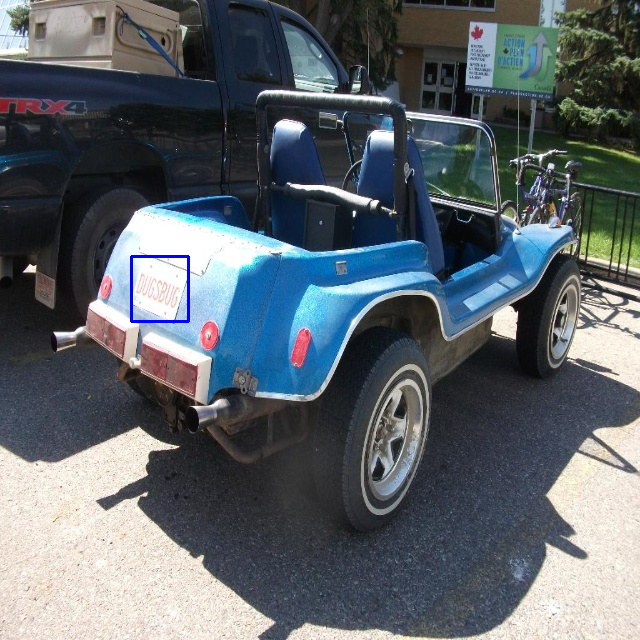

In [ ]:
# verify boxes are converted correctly
# test with different i
i = 1
# test
color = (255, 0, 0)

# Line thickness of 2 px
thickness = 2

image = cv2.imread(f'images/train/{new_coors.iloc[i]["filename"]}', cv2.IMREAD_UNCHANGED)
image = cv2.rectangle(image,
                      (int(new_coors.iloc[i]["x_min"]),int(new_coors.iloc[i]["y_min"])),
                      (int(new_coors.iloc[i]["x_max"]),int(new_coors.iloc[i]["y_max"])),
                      color, thickness)

# Displaying the image
cv2_imshow(image)

## Converting CSV to TFRecords

In [ ]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

import os
import io
import pandas as pd
import tensorflow as tf

from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict

def class_text_to_int(row_label):
    if row_label == 'car_plate':
        return 1
    else:
        None

def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

def create_tf_example(group, path):
    with tf.compat.v1.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_image = fid.read()
    encoded_image_io = io.BytesIO(encoded_image)
    image = Image.open(encoded_image_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['x_min'] / width)
        xmaxs.append(row['x_max'] / width)
        ymins.append(row['y_min'] / height)
        ymaxs.append(row['y_max'] / height)
        #classes_text.append(row['class'].encode('utf8'))
        classes_text.append('car_plate'.encode('utf8'))
        classes.append(class_text_to_int('car_plate'))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_image),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))

    return tf_example

In [ ]:

# for directory in ['train', 'test']:
for directory in ['train']:
  output_path = os.path.join(os.getcwd(), f'annotations/{directory}_new_320.tfrecord')
  input_path = os.path.join(os.getcwd(), f'annotations/{directory}_labels_new_320.csv')

  writer = tf.io.TFRecordWriter(output_path)
  path = os.path.join(os.getcwd(), f'images/{directory}')
  examples = pd.read_csv(input_path)
  grouped = split(examples, 'filename')
  for group in grouped:
      tf_example = create_tf_example(group, path)
      writer.write(tf_example.SerializeToString())

  writer.close()
  print(f'Successfully created the TFRecords: {output_path}')


### Creating labelmap_path

In [ ]:
label_map = """
item {
  id: 1,
  name: 'car_plate'
}
"""

with open("annotations/label_map_320.pbtxt", "w") as label_file:
  label_file.write(label_map)

In [ ]:
!ls '{proj_dir}/annotations/'

In [ ]:
train_record_path = f'{proj_dir}/annotations/train_new.tfrecord'
test_record_path = f'{proj_dir}/annotations/train_new.tfrecord'
labelmap_path = f'{proj_dir}/annotations/label_map.pbtxt'

# Train SSD

In [ ]:
import re

batch_size = 24
num_steps = 25000 # model seems to converge around 25K steps, loss doesn't considerably drop further
num_eval_steps = 50
iou_threshold = 0.50


base_config_path = f'{proj_dir}/TensorFlow/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/pipeline.config'
fine_tune_checkpoint = f'{proj_dir}/TensorFlow/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0'

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:

  # Set labelmap path
  config = re.sub('label_map_path: ".*?"',
             f'label_map_path: "{labelmap_path}"', config)

  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  f'fine_tune_checkpoint: "{fine_tune_checkpoint}"', config)

  # Set train tf-record file path
  config = re.sub('(train_input_reader.*?tf_record_input_reader.*?input_path.*?").*?(")', fr'\1{train_record_path}\2', config, flags=re.DOTALL)

  # Set test tf-record file path
  config = re.sub('(eval_input_reader.*?tf_record_input_reader.*?input_path.*?").*?(")', fr'\1{test_record_path}\2', config, flags=re.DOTALL)

  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: 2', config)

  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  f'batch_size: {batch_size}', config)

  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  f'num_steps: {num_steps}', config)

  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"',
             'fine_tune_checkpoint_type: "detection"', config)

  config = re.sub('iou_threshold: [0-9].[0-9]+',
               'iou_threshold: {}'.format(iou_threshold), config)

  f.write(config)

  print(config)


model {
  ssd {
    num_classes: 2
    image_resizer {
      fixed_shape_resizer {
        height: 320
        width: 320
      }
    }
    feature_extractor {
      type: "ssd_mobilenet_v2_fpn_keras"
      depth_multiplier: 1.0
      min_depth: 16
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 3.9999998989515007e-05
          }
        }
        initializer {
          random_normal_initializer {
            mean: 0.0
            stddev: 0.009999999776482582
          }
        }
        activation: RELU_6
        batch_norm {
          decay: 0.996999979019165
          scale: true
          epsilon: 0.0010000000474974513
        }
      }
      use_depthwise: true
      override_base_feature_extractor_hyperparams: true
      fpn {
        min_level: 3
        max_level: 7
        additional_layer_depth: 128
      }
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
 

## Train

In [ ]:
!ls '{proj_dir}/TensorFlow/models/research/object_detection/model_main_tf2.py'

'/content/gdrive/My Drive/colab_notebooks/SSD/TensorFlow/models/research/object_detection/model_main_tf2.py'


In [ ]:
!mkdir training_models/ssd_oct_320

In [ ]:
!python TensorFlow/models/research/object_detection/model_main_tf2.py  \
   --pipeline_config_path=model_config.config \
   --model_dir=training_models/ssd_oct_320 \
   --alsologtostderr

In [ ]:
!mkdir models/ssd_oct_320

In [ ]:
!python TensorFlow/models/research/object_detection/exporter_main_v2.py \
  --pipeline_config_path=model_config.config \
  --trained_checkpoint_dir=training_models/ssd_oct_320 \
  --output_directory=models/ssd_oct_320 \
  --input_type=image_tensor \
  --alsologtostderr

In [ ]:
## eval
!python TensorFlow/models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path=model_config.config \
  --model_dir=models/ssd_oct_320 \
  --checkpoint_dir=models/ssd_oct_320/checkpoint \
  --alsologtostderr

2022-11-21 12:36:41.885443: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-21 12:36:42.048657: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-21 12:36:42.813467: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-21 12:36:42.813562: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plug

# Train with multi-box examples

Above only the first box of the labelled image was used, mainly for convenience.

Manual inspection shown that the model couldn't detect well cases where multiple plates exist in the same image. This section reruns the training with proper labels.

In [ ]:
%cd $proj_dir

/content/gdrive/My Drive/colab_notebooks/SSD


In [ ]:
resize_imgs(f'{proj_dir}/open_dataset/train','images/train/',new_width=320,new_height=320)

In [ ]:
new_coors = convert_coors_all_labels(f'{proj_dir}/open_dataset/train','annotations/train_labels_new_320.csv',img_width=320,img_height=320)

In [ ]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

import os
import io
import pandas as pd
import tensorflow as tf

from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict

def class_text_to_int(row_label):
    if row_label == 'car_plate':
        return 1
    else:
        None

def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

def create_tf_example(group, path):
    with tf.compat.v1.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_image = fid.read()
    encoded_image_io = io.BytesIO(encoded_image)
    image = Image.open(encoded_image_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['x_min'] / width)
        xmaxs.append(row['x_max'] / width)
        ymins.append(row['y_min'] / height)
        ymaxs.append(row['y_max'] / height)
        #classes_text.append(row['class'].encode('utf8'))
        classes_text.append('car_plate'.encode('utf8'))
        classes.append(class_text_to_int('car_plate'))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_image),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))

    return tf_example

In [ ]:
for directory in ['train']:
  output_path = os.path.join(os.getcwd(), f'annotations/{directory}_new_multi_320.tfrecord')
  input_path = os.path.join(os.getcwd(), f'annotations/{directory}_labels_new_320.csv')

  writer = tf.io.TFRecordWriter(output_path)
  path = os.path.join(os.getcwd(), f'images/{directory}')
  examples = pd.read_csv(input_path)
  grouped = split(examples, 'filename')
  for group in grouped:
      tf_example = create_tf_example(group, path)
      writer.write(tf_example.SerializeToString())

  writer.close()
  print(f'Successfully created the TFRecords: {output_path}')


Successfully created the TFRecords: /content/gdrive/MyDrive/colab_notebooks/SSD/annotations/train_new_multi_320.tfrecord


In [ ]:
label_map = """
item {
  id: 1,
  name: 'car_plate'
}
"""

with open("annotations/label_map_new_multi.pbtxt", "w") as label_file:
  label_file.write(label_map)


train_record_path = f'{proj_dir}/annotations/train_new_multi_320.tfrecord'
test_record_path = f'{proj_dir}/annotations/train_new_multi_320.tfrecord'
labelmap_path = f'{proj_dir}/annotations/label_map.pbtxt'

In [ ]:
batch_size = 24
num_steps = 30000 # model seems to converge around 25K steps, loss doesn't considerably drop further
num_eval_steps = 50
iou_threshold = 0.50


base_config_path = f'{proj_dir}/TensorFlow/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/pipeline.config'
fine_tune_checkpoint = f'{proj_dir}/TensorFlow/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0'

import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:

  # Set labelmap path
  config = re.sub('label_map_path: ".*?"',
             f'label_map_path: "{labelmap_path}"', config)

  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  f'fine_tune_checkpoint: "{fine_tune_checkpoint}"', config)

  # Set train tf-record file path
  config = re.sub('(train_input_reader.*?tf_record_input_reader.*?input_path.*?").*?(")', fr'\1{train_record_path}\2', config, flags=re.DOTALL)

  # Set test tf-record file path
  config = re.sub('(eval_input_reader.*?tf_record_input_reader.*?input_path.*?").*?(")', fr'\1{test_record_path}\2', config, flags=re.DOTALL)

  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: 2', config)

  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  f'batch_size: {batch_size}', config)

  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  f'num_steps: {num_steps}', config)

  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"',
             'fine_tune_checkpoint_type: "detection"', config)

  config = re.sub('iou_threshold: [0-9].[0-9]+',
               'iou_threshold: {}'.format(iou_threshold), config)

  f.write(config)

In [ ]:
print(config)

In [ ]:
!mkdir training_models/ssd_nov_320_multi_2

In [ ]:
!python TensorFlow/models/research/object_detection/model_main_tf2.py  \
  --pipeline_config_path=model_config.config \
  --model_dir=training_models/ssd_nov_320_multi_2 \
  --alsologtostderr

2022-11-24 12:36:44.856831: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-24 12:36:45.793533: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-24 12:36:45.793683: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-24 12:36:45.793700: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF

In [ ]:
!python TensorFlow/models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path=model_config.config \
  --model_dir=training_models/ssd_nov_320_multi_2 \
  --checkpoint_dir=training_models/ssd_nov_320_multi_2 \
  --alsologtostderr

2022-11-24 12:48:20.071604: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-24 12:48:20.999939: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-24 12:48:21.000056: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-24 12:48:21.000076: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF

In [ ]:
!python TensorFlow/models/research/object_detection/exporter_main_v2.py \
  --pipeline_config_path=model_config.config \
  --trained_checkpoint_dir=training_models/ssd_nov_320_multi_2 \
  --output_directory=models/ssd_nov_320_multi_2 \
  --input_type=image_tensor \
  --alsologtostderr

2022-11-24 12:50:01.900087: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-24 12:50:01.900224: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-24 12:50:01.900246: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
/usr/local/lib/python3.7/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:67: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow ver

# Testing

In [ ]:
import os
import io
import pandas as pd
import tensorflow as tf

from PIL import Image


In [ ]:
%cd $proj_dir

[Errno 2] No such file or directory: '$proj_dir'
/content


In [ ]:
def load_local_model(path):
  return tf.saved_model.load(path)


def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name,
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  return load_local_model(str(model_dir))


# Model 1:
ssd_320 = load_local_model("models/ssd_oct_320/saved_model/")
ssd_320_m = load_local_model("models/ssd_nov_320_multi_2/saved_model/")

In [ ]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
import pathlib

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [ ]:
IMAGE_SIZE = (12, 8)

def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy()
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.3,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict


def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)
  plt.show()

In [ ]:
labelmap_path = f'{proj_dir}/annotations/label_map_new_multi.pbtxt'

SSD 320


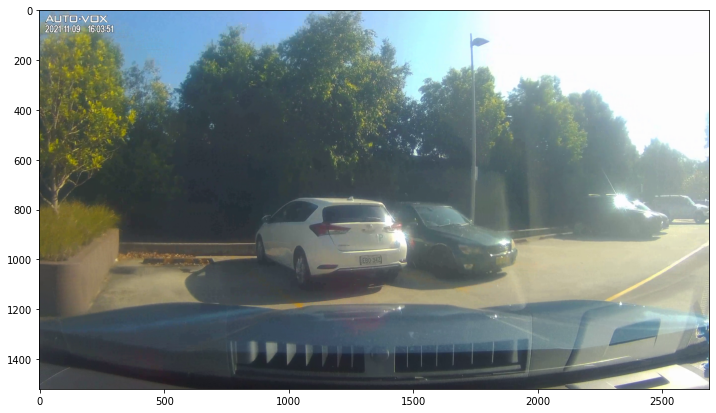

SSD 320 m


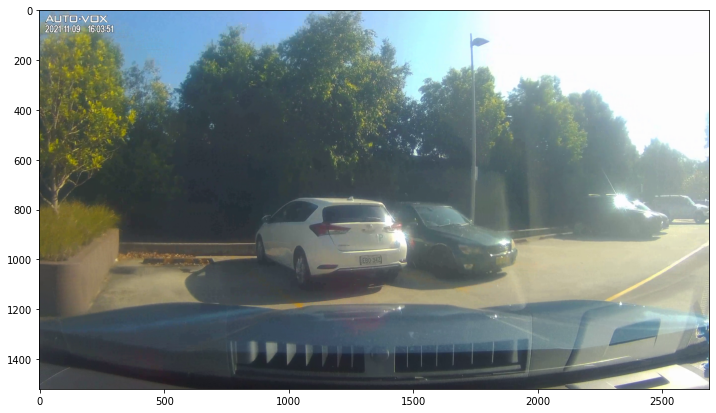

SSD 320


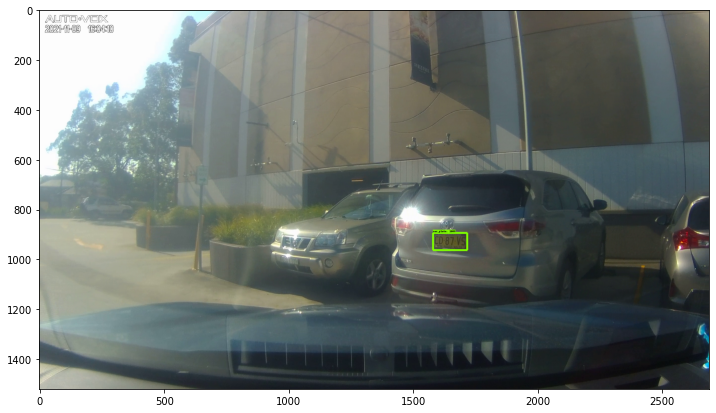

SSD 320 m


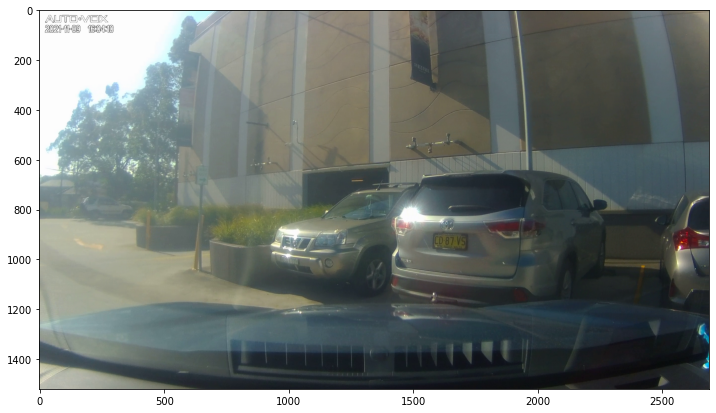

SSD 320


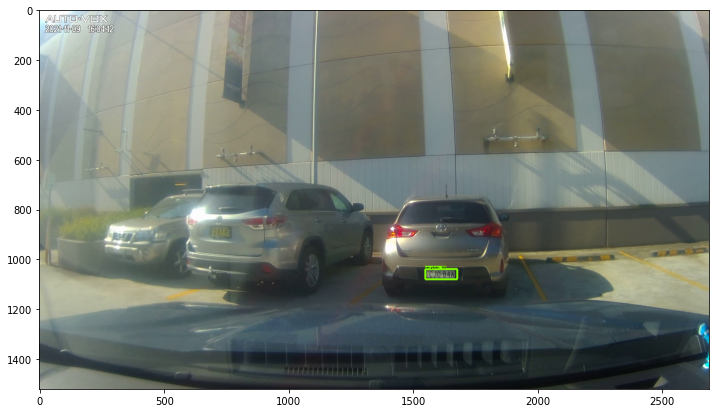

SSD 320 m


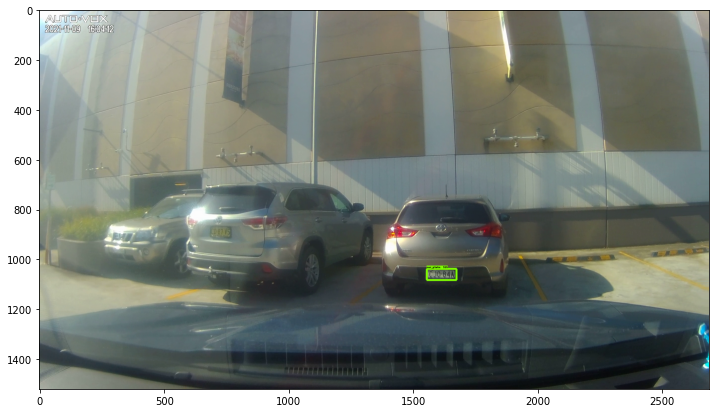

SSD 320


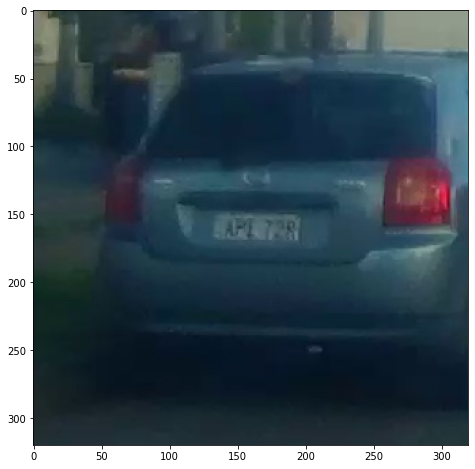

SSD 320 m


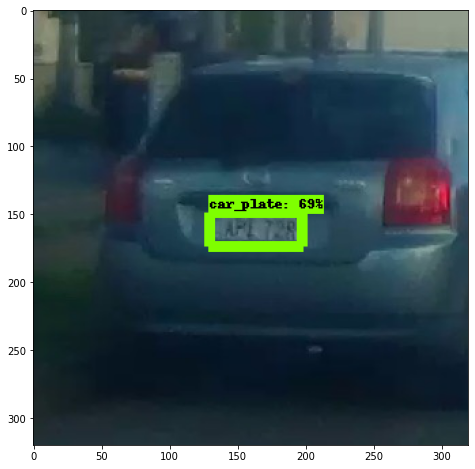

SSD 320


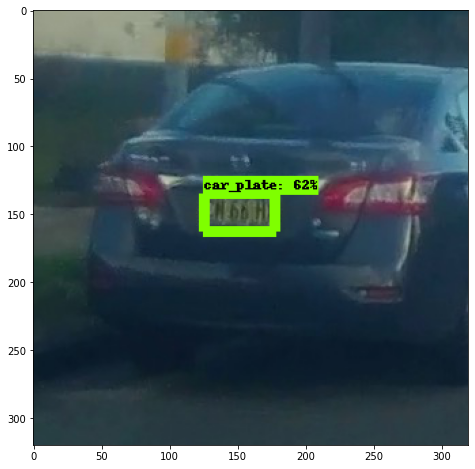

SSD 320 m


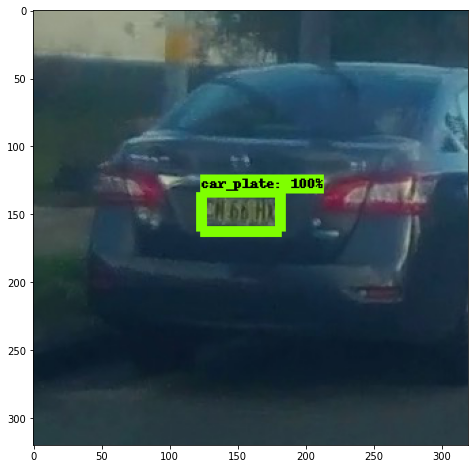

SSD 320


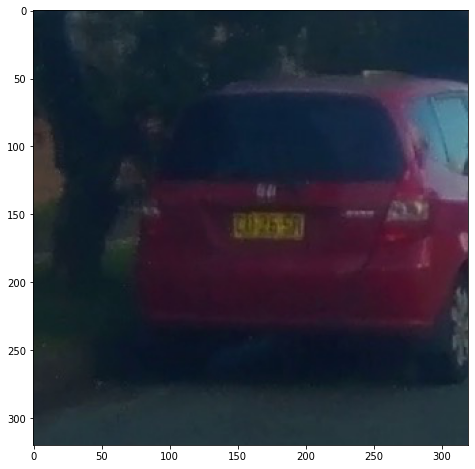

SSD 320 m


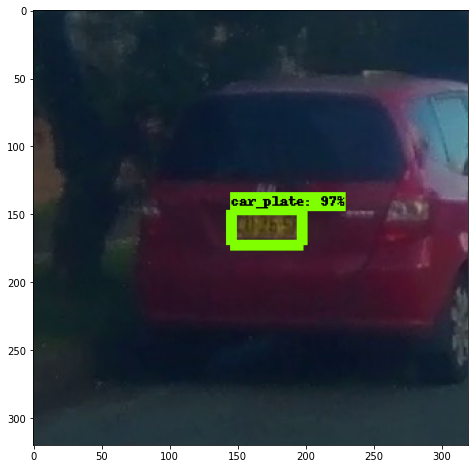

SSD 320


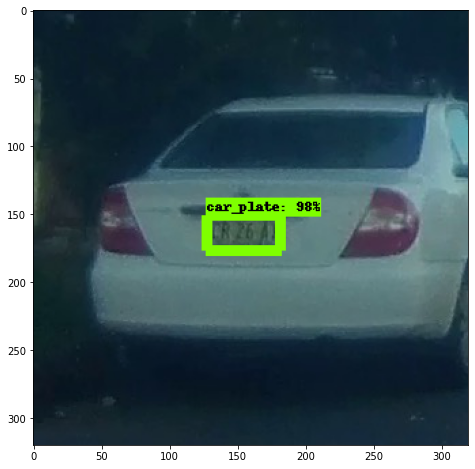

SSD 320 m


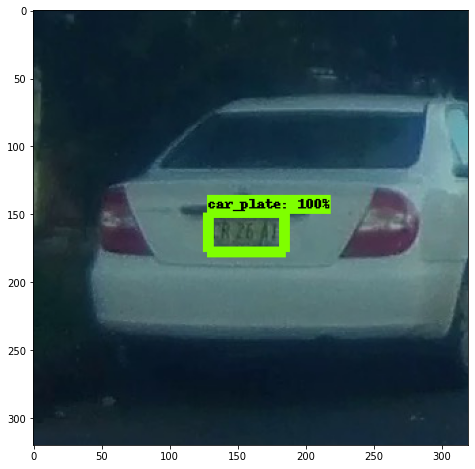

SSD 320


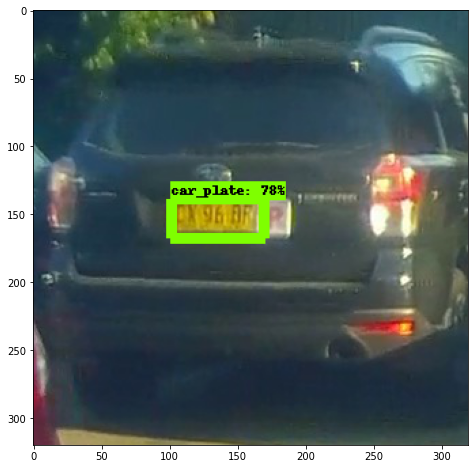

SSD 320 m


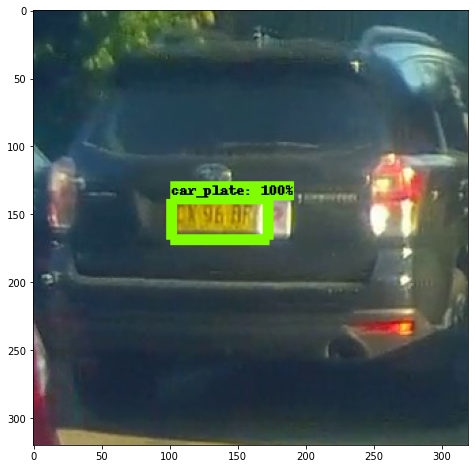

SSD 320


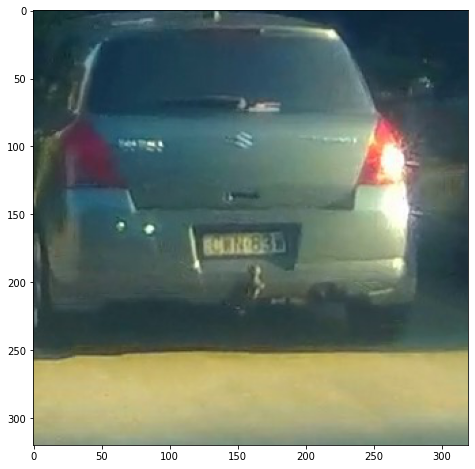

SSD 320 m


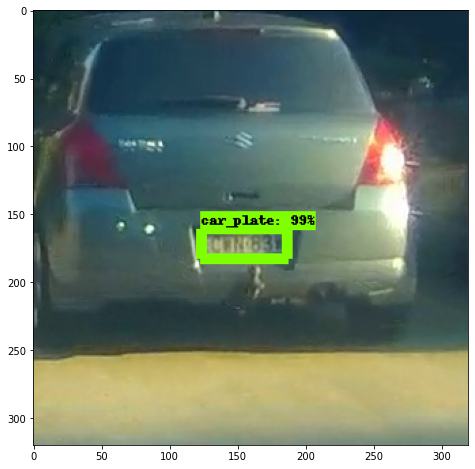

SSD 320


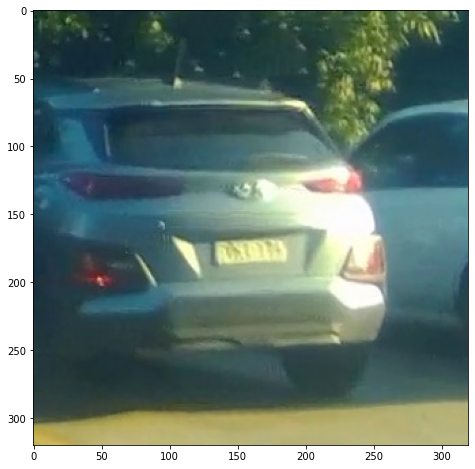

SSD 320 m


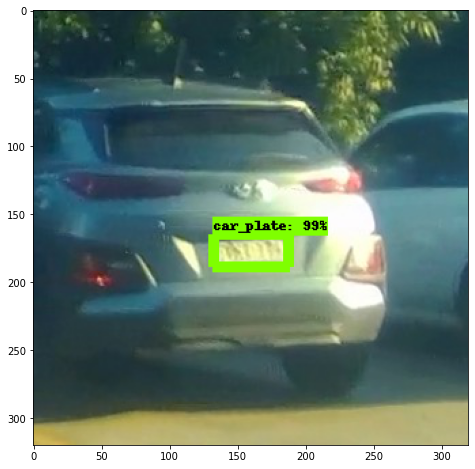

SSD 320


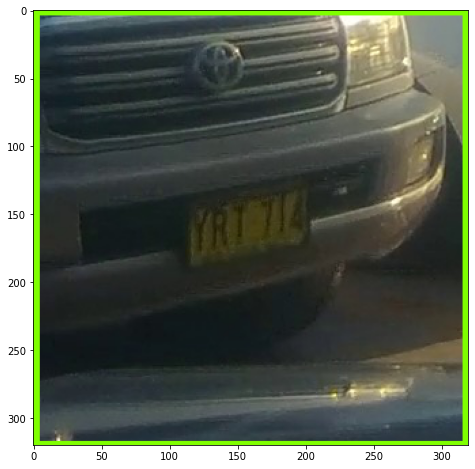

SSD 320 m


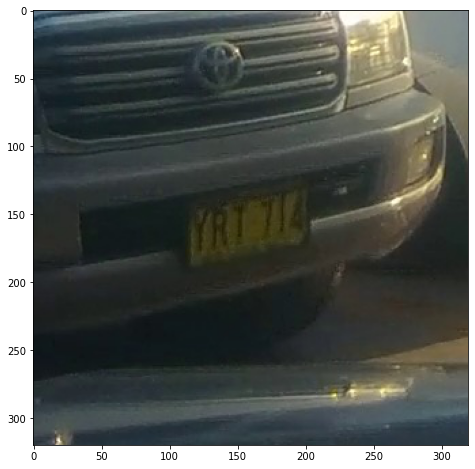

SSD 320


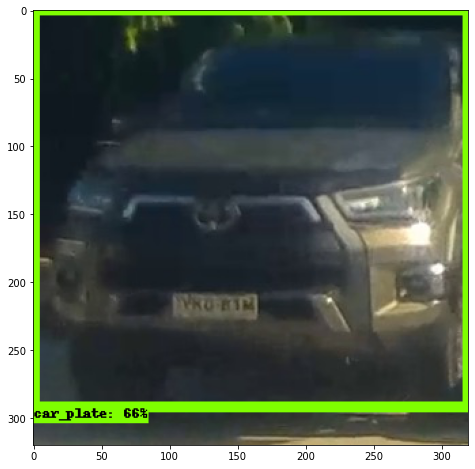

SSD 320 m


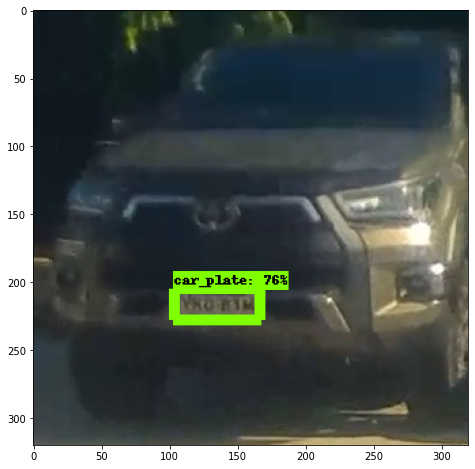

SSD 320


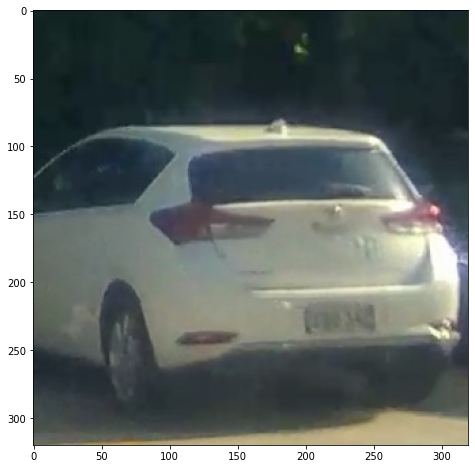

SSD 320 m


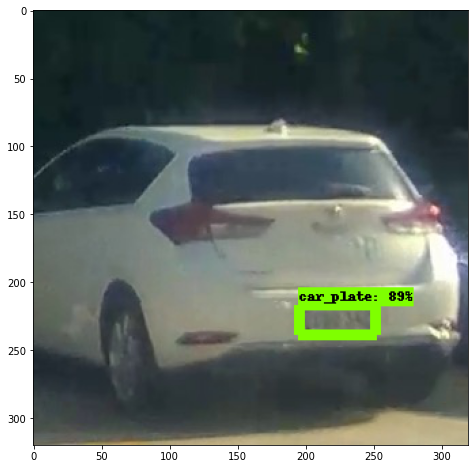

SSD 320


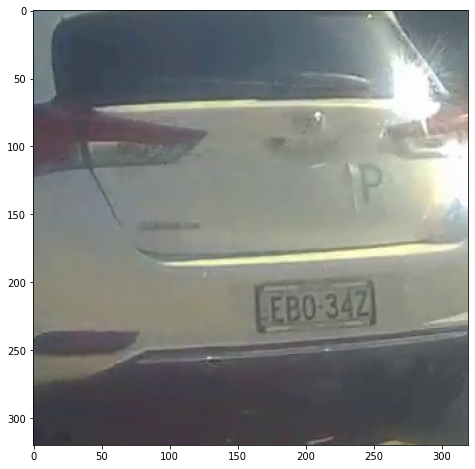

SSD 320 m


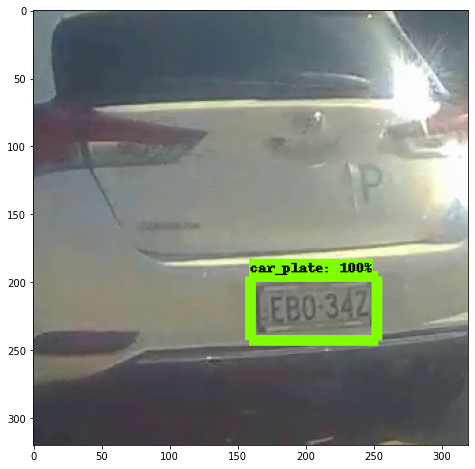

SSD 320


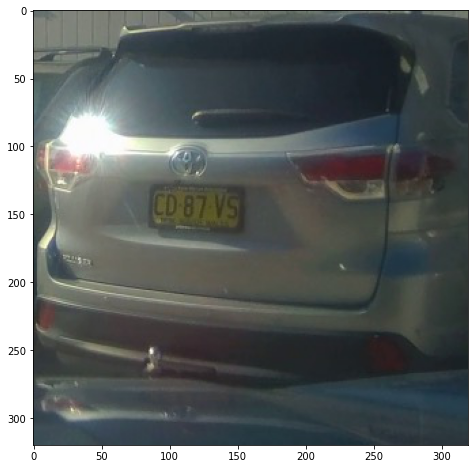

SSD 320 m


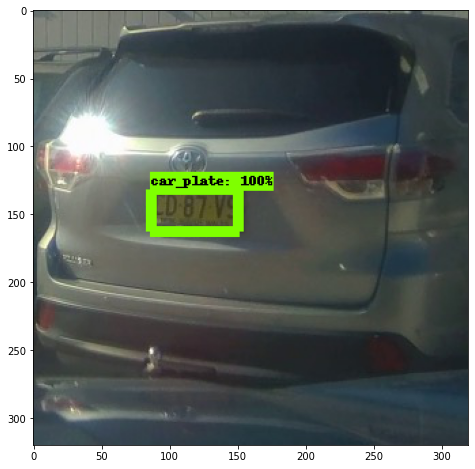

SSD 320


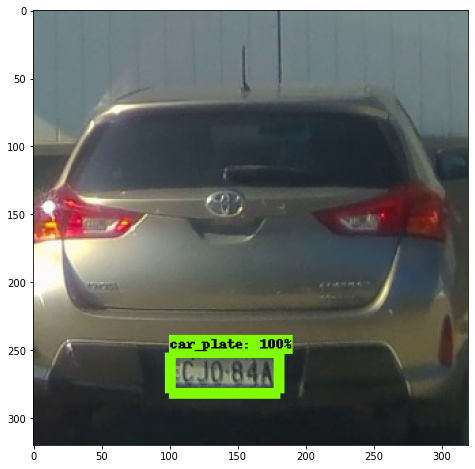

SSD 320 m


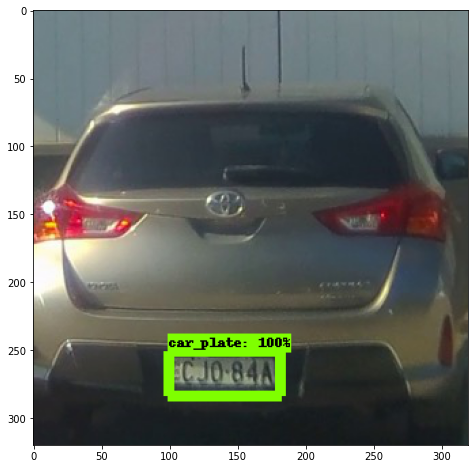

SSD 320


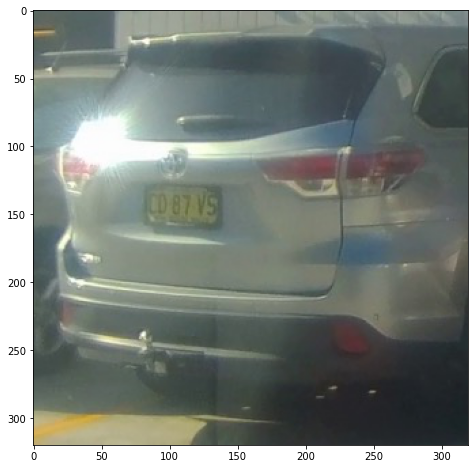

SSD 320 m


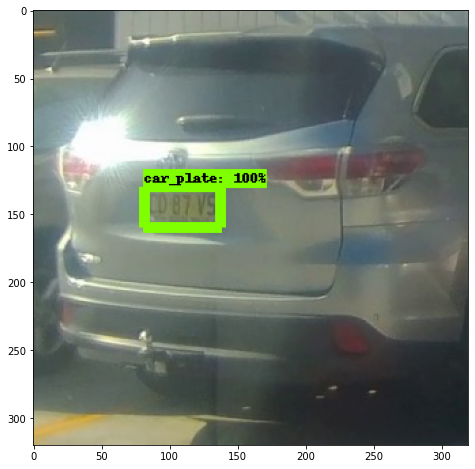

SSD 320


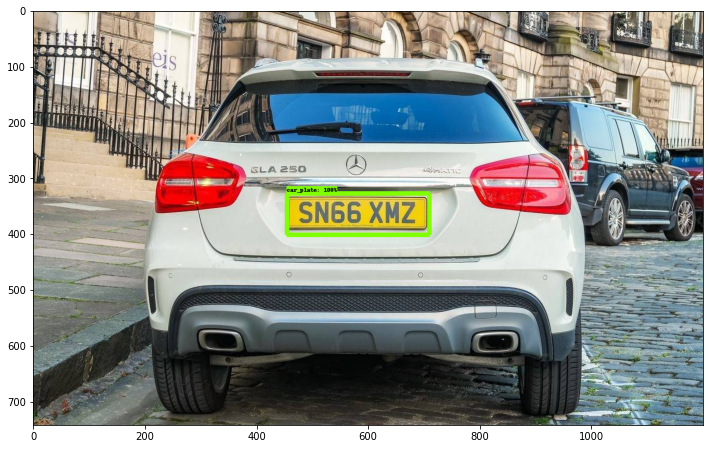

SSD 320 m


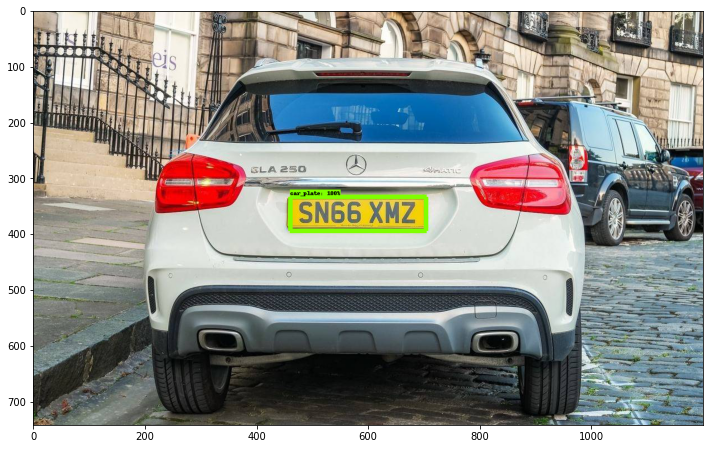

SSD 320


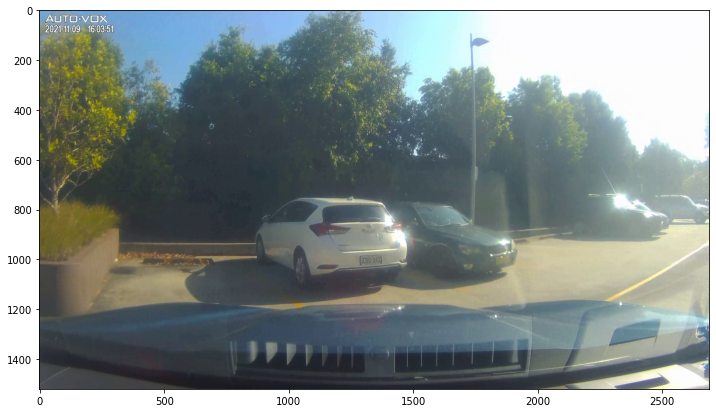

SSD 320 m


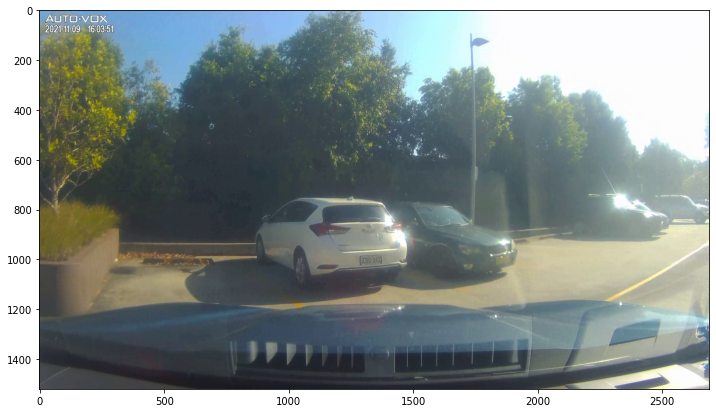

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)
for image_path in glob.glob('images/test/*'):
  print("SSD 320")
  show_inference(ssd_320, image_path)
  print("SSD 320 m")
  show_inference(ssd_320_m, image_path)

# Convert models

In [ ]:
!pip install tflite_support

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 60.9 MB 316 kB/s 
     |████████████████████████████████| 216 kB 85.6 MB/s 


In [ ]:
import os
import tensorflow as tf
from tflite_support.metadata_writers import object_detector
from tflite_support.metadata_writers import writer_utils

In [ ]:
%cd $proj_dir

/content/gdrive/My Drive/colab_notebooks/SSD


In [ ]:
!python TensorFlow/models/research/object_detection/export_tflite_graph_tf2.py  \
  --pipeline_config_path=model_config.config \
  --trained_checkpoint_dir=training_models/ssd_nov_320_multi_2 \
  --output_directory=models/ssd_nov_320_multi_2

2022-11-24 12:54:43.589686: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-24 12:54:43.589803: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-24 12:54:43.589827: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
/usr/local/lib/python3.7/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:67: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow ver

In [ ]:
# !python TensorFlow/models/research/object_detection/export_tflite_graph_tf2.py  \
#   --pipeline_config_path=model_config.config \
#   --trained_checkpoint_dir=training_models/ssd_oct \
#   --output_directory=models/ssd_oct_320

In [ ]:
SAVE_MODEL_DIR = "models/ssd_nov_320_multi_2"
#SAVE_MODEL_DIR = "models/ssd_oct_640"

# Convert the model
converter = tf.lite.TFLiteConverter.from_saved_model(os.path.join(SAVE_MODEL_DIR,'saved_model'))
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.float16]
converter.target_spec.supported_ops = [
  tf.lite.OpsSet.TFLITE_BUILTINS, # enable TensorFlow Lite ops.
  #tf.lite.OpsSet.SELECT_TF_OPS # enable TensorFlow ops. not needed
]
tflite_model = converter.convert()

# Save the model.
tflite_path = os.path.join(SAVE_MODEL_DIR,'ssd.tflite')
with open(tflite_path, 'wb') as f:
    f.write(tflite_model)

# Writing metadata

with open('/tmp/labels.txt', 'w') as f:
    f.write('license-plate\n')

ObjectDetectorWriter = object_detector.MetadataWriter
_MODEL_PATH = tflite_path
# Task Library expects label files that are in the same format as the one below.
_LABEL_FILE = "/tmp/labels.txt"
_SAVE_TO_PATH = os.path.join(SAVE_MODEL_DIR,"ssd_with_metadata.tflite")
# Normalization parameters is required when reprocessing the image. It is
# optional if the image pixel values are in range of [0, 255] and the input
# tensor is quantized to uint8. See the introduction for normalization and
# quantization parameters below for more details.
# https://www.tensorflow.org/lite/models/convert/metadata#normalization_and_quantization_parameters)
_INPUT_NORM_MEAN = 127.5
_INPUT_NORM_STD = 127.5

# Create the metadata writer.
writer = ObjectDetectorWriter.create_for_inference(
    writer_utils.load_file(_MODEL_PATH), [_INPUT_NORM_MEAN], [_INPUT_NORM_STD],
    [_LABEL_FILE])

# Verify the metadata generated by metadata writer.
print(writer.get_metadata_json())

# Populate the metadata into the model.
writer_utils.save_file(writer.populate(), _SAVE_TO_PATH)

{
  "name": "ObjectDetector",
  "description": "Identify which of a known set of objects might be present and provide information about their positions within the given image or a video stream.",
  "subgraph_metadata": [
    {
      "input_tensor_metadata": [
        {
          "name": "image",
          "description": "Input image to be detected.",
          "content": {
            "content_properties_type": "ImageProperties",
            "content_properties": {
              "color_space": "RGB"
            }
          },
          "process_units": [
            {
              "options_type": "NormalizationOptions",
              "options": {
                "mean": [
                  127.5
                ],
                "std": [
                  127.5
                ]
              }
            }
          ],
          "stats": {
            "max": [
              1.0
            ],
            "min": [
              -1.0
            ]
          }
        }
      ],
     